This notebook illustrates using clustering and our descriptors compounds.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objs as go
pyo.init_notebook_mode()


from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings("ignore")

In [2]:
# import data
data = pd.read_csv("./data-descriptors.csv")

In [3]:
data.head(2)

,SMILES,ALogP,ALogp2,AMR,apol,nAcid,naAromAtom,nAromBond,nAtom,ATSc1,...,MW,WTPT-1,WTPT-2,WTPT-3,WTPT-4,WTPT-5,WPATH,WPOL,XLogP,Zagreb
0,CC(=O)O,-0.2299,0.052854,12.6437,7.791172,1,0,0,8,0.194598,...,60.052045,6.732051,1.683013,4.488034,4.488034,0.0,9.0,0.0,-0.080,12.0
1,C1=CC=C(C=C1)CO,1.2255,1.501850,32.8739,18.456344,0,6,6,16,0.090273,...,108.138082,15.692665,1.961583,2.452455,2.452455,0.0,64.0,7.0,1.211,34.0


In [20]:
# getting all descriptors except compound name
without_compound = data.drop(['SMILES'], axis=1)
without_compound.head(2)

,ALogP,ALogp2,AMR,apol,nAcid,naAromAtom,nAromBond,nAtom,ATSc1,ATSc2,...,MW,WTPT-1,WTPT-2,WTPT-3,WTPT-4,WTPT-5,WPATH,WPOL,XLogP,Zagreb
0,-0.2299,0.052854,12.6437,7.791172,1,0,0,8,0.194598,-0.091012,...,60.052045,6.732051,1.683013,4.488034,4.488034,0.0,9.0,0.0,-0.080,12.0
1,1.2255,1.501850,32.8739,18.456344,0,6,6,16,0.090273,-0.042807,...,108.138082,15.692665,1.961583,2.452455,2.452455,0.0,64.0,7.0,1.211,34.0


In [21]:
without_compound = without_compound.drop(["geomShape"], axis=1)

In [22]:
for col in without_compound.columns:
    if without_compound[col].isna().sum() > 0:
        print(col, without_compound[col].isna().sum())
        without_compound[col] =without_compound[col].fillna(without_compound[col].mean())

apol 1
ATSc1 22
ATSc2 22
ATSc3 22
ATSc4 22
ATSc5 22
ATSm1 1
ATSm2 1
BCUTw-1l 48
BCUTw-1h 48
BCUTc-1l 48
BCUTc-1h 48
BCUTp-1l 48
BCUTp-1h 48
bpol 1
SC-3 3
SC-4 3
SC-5 3
SC-6 3
VC-3 3
VC-4 3
VC-5 3
VC-6 3
SPC-4 3
SPC-5 3
SPC-6 3
VPC-4 3
VPC-5 3
VPC-6 3
SP-0 6
SP-1 6
SP-2 6
SP-3 6
SP-4 6
SP-5 6
SP-6 6
SP-7 6
VP-0 6
VP-1 6
VP-2 6
VP-3 6
VP-4 6
VP-5 6
VP-6 6
VP-7 6
ECCEN 6
FMF 6
Fsp3 6
fragC 6
nHBAcc 6
nHBDon 6
HybRatio 39
JPLogP 67
Kier1 6
Kier2 6
Kier3 37
khs.sLi 6
khs.ssBe 6
khs.ssssBe 6
khs.ssBH 6
khs.sssB 6
khs.ssssB 6
khs.sCH3 6
khs.dCH2 6
khs.ssCH2 6
khs.tCH 6
khs.dsCH 6
khs.aaCH 6
khs.sssCH 6
khs.ddC 6
khs.tsC 6
khs.dssC 6
khs.aasC 6
khs.aaaC 6
khs.ssssC 6
khs.sNH3 6
khs.sNH2 6
khs.ssNH2 6
khs.dNH 6
khs.ssNH 6
khs.aaNH 6
khs.tN 6
khs.sssNH 6
khs.dsN 6
khs.aaN 6
khs.sssN 6
khs.ddsN 6
khs.aasN 6
khs.ssssN 6
khs.sOH 6
khs.dO 6
khs.ssO 6
khs.aaO 6
khs.sF 6
khs.sSiH3 6
khs.ssSiH2 6
khs.sssSiH 6
khs.ssssSi 6
khs.sPH2 6
khs.ssPH 6
khs.sssP 6
khs.dsssP 6
khs.sssssP 6
khs.sSH 6
khs.dS 6
khs.

In [23]:
without_compound.isna().sum().sum()

0

In [24]:
# scaling our data by using standard scaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(without_compound)

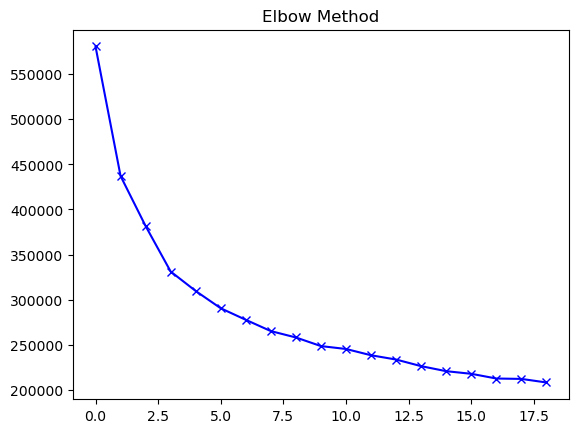

In [25]:
# elbow method
n_clusters = 20
cost = []
for i in range(1, n_clusters):
    kmean= KMeans(i, n_init=10, max_iter=1000)
    kmean.fit(X_scaled)
    cost.append(kmean.inertia_)  

plt.title("Elbow Method")
plt.plot(cost, 'bx-');

In [27]:
kmean = KMeans(4, n_init=10, max_iter=1000)
kmean.fit(X_scaled)
labels = kmean.labels_

In [28]:
# adding clusters to our data
clusters = pd.concat([without_compound, pd.DataFrame({'cluster': labels})], axis=1)
clusters.head()

,ALogP,ALogp2,AMR,apol,nAcid,naAromAtom,nAromBond,nAtom,ATSc1,ATSc2,...,WTPT-1,WTPT-2,WTPT-3,WTPT-4,WTPT-5,WPATH,WPOL,XLogP,Zagreb,cluster
0,-0.2299,0.052854,12.6437,7.791172,1,0,0,8,0.194598,-0.091012,...,6.732051,1.683013,4.488034,4.488034,0.000000,9.0,0.0,-0.080,12.0,0
1,1.2255,1.501850,32.8739,18.456344,0,6,6,16,0.090273,-0.042807,...,15.692665,1.961583,2.452455,2.452455,0.000000,64.0,7.0,1.211,34.0,0
2,-2.0430,4.173849,26.7438,18.838723,1,0,0,19,0.400512,-0.239284,...,14.279081,1.784885,7.873996,4.709438,3.164558,66.0,5.0,-3.393,34.0,0
3,-1.3652,1.863771,29.0216,19.505516,1,0,0,20,0.321931,-0.194745,...,14.279081,1.784885,7.873996,4.709438,3.164558,66.0,5.0,-2.912,34.0,0
4,-1.3950,1.946025,35.6239,21.508344,3,0,0,21,0.702279,-0.209376,...,23.918451,1.839881,16.754366,16.754366,0.000000,246.0,16.0,-2.247,58.0,0


In [30]:
# using pca with 2 components to visualize our scaled data with clusters
components = 2

# initilizing and fitting the pca
pca = PCA(n_components=components)
X_pca = pca.fit_transform(X_scaled)

# making dataframe for our pca components
pca_df = pd.DataFrame(X_pca, columns=['PCA1','PCA2'])

# adding cluster assignment
pca_df['cluster'] = pd.Categorical(kmean.labels_)

# adding compound name to this dataframe
# pca_df['compound'] = data['Compound']

# get the index of the most important feature on EACH component i.e. largest absolute value
most_important = [np.abs(pca.components_[i]).argmax() for i in range(components)]

# columns/ features of our data
initial_feature_names = without_compound.columns

# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(components)]

# using LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i + 1): most_important_names[i] for i in range(components)}

# explained variance
print("Explained variance ratio", pca.explained_variance_ratio_)
print("\nnSum of Explained variance ratio", pca.explained_variance_ratio_.sum())
print("\nColumns chosen by PCA", dic)


pca_df

Explained variance ratio [0.3930098  0.07487326]

nSum of Explained variance ratio 0.46788306607041547

Columns chosen by PCA {'PC1': 'Zagreb', 'PC2': 'khs.ssssC'}


,PCA1,PCA2,cluster
0,-7.792877,3.207437,0
1,-6.996826,2.663186,0
2,-6.199148,1.731558,0
3,-6.202703,1.657440,0
4,-5.493125,2.307213,0
...,...,...,...
3101,6.494252,-7.922993,3
3102,6.867045,-6.884564,3
3103,0.570989,-1.202867,0
3104,9.168745,0.422486,3


In [31]:
fig = px.scatter(pca_df, x='PCA1', y='PCA2', color="cluster", title="Compounds Clustering", width=800)

# saving the figure in html file
# fig.write_html("../results/compounds_clustering.html")

fig.show()

In [33]:
pca_df

,PCA1,PCA2,cluster
0,-7.792877,3.207437,0
1,-6.996826,2.663186,0
2,-6.199148,1.731558,0
3,-6.202703,1.657440,0
4,-5.493125,2.307213,0
...,...,...,...
3101,6.494252,-7.922993,3
3102,6.867045,-6.884564,3
3103,0.570989,-1.202867,0
3104,9.168745,0.422486,3


# Interpretation

In [46]:
results = clusters[['cluster']].copy()

In [47]:
results['smiles'] = data['SMILES']

In [48]:
# checking if any smiles is has been assigned to more than one cluster
for co in results['smiles'].unique():
    if results[results['smiles'] == co]['cluster'].nunique() > 1:
        print(co)
print("Finished!")

Finished!


In [49]:
# sorting values by cluster to make it easier to look in excel sheet
results.sort_values('cluster', inplace=True)
results

,cluster,smiles
0,0,CC(=O)O
1701,0,C1=C(OC(=C1)[N+](=O)[O-])C=NNC(=O)N
1702,0,CC[N+](CC)(CC)CCOC1=C(C(=CC=C1)OCC[N+](CC)(CC)...
1703,0,C[N+]1(C2CC(CC1C3C2O3)OC(=O)C(CO)C4=CC=CC=C4)C...
1704,0,CC1C(C(=O)N1S(=O)(=O)O)NC(=O)C(=NOC(C)(C)C(=O)...
...,...,...
1951,3,CN1CCC2=CC(=C3C=C2C1CC4=CC=C(C=C4)OC5=C6C(CC7=...
1957,3,CC1CC=CC=CC=CC=CC(CC2C(C(CC(O2)(CC(CC3C(O3)C=C...
1958,3,C1C(CN2C1C(=O)NC(C(=O)NC(C(=O)NC(C(=O)NC(C(=O)...
1911,3,CSCCC(C(=O)NCC(=O)NC(CC1=CNC2=CC=CC=C21)C(=O)N...


In [50]:
# saving the results into excel sheet
results.to_excel('./clusters.xlsx', index=False)

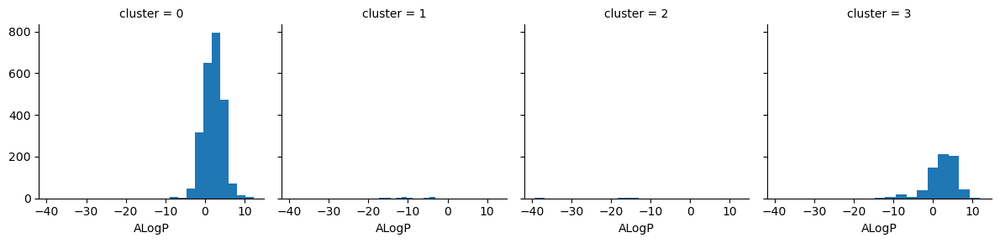

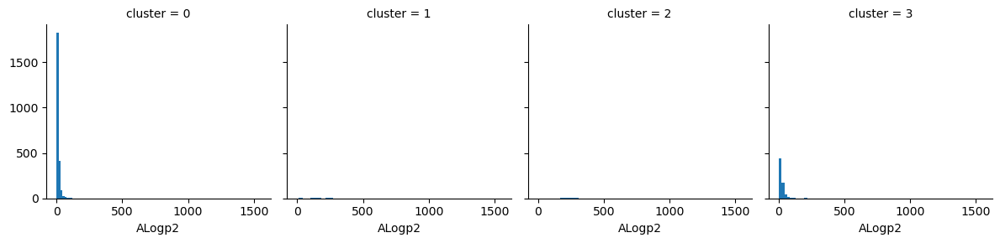

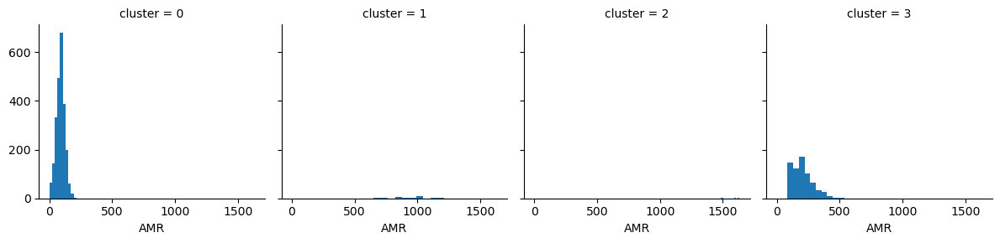

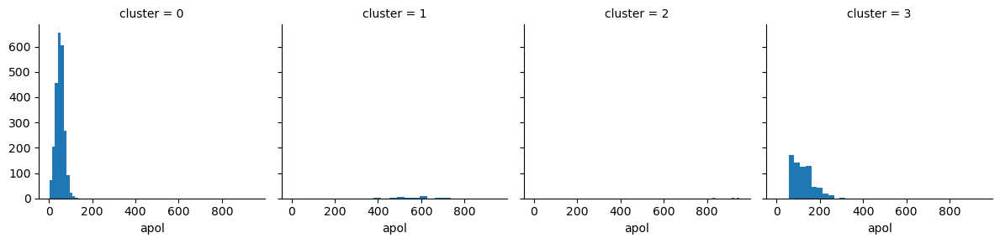

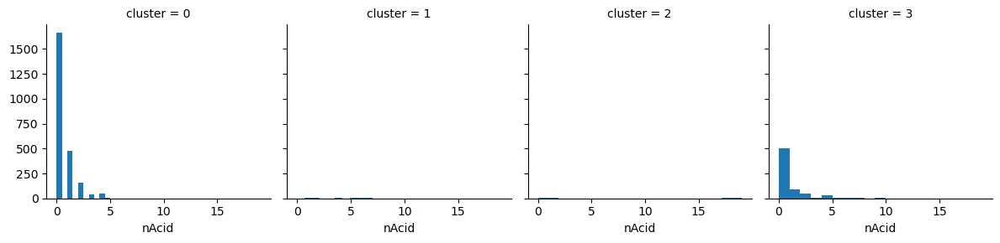

...

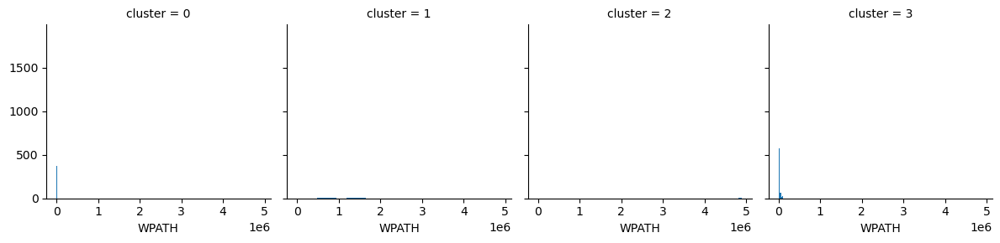

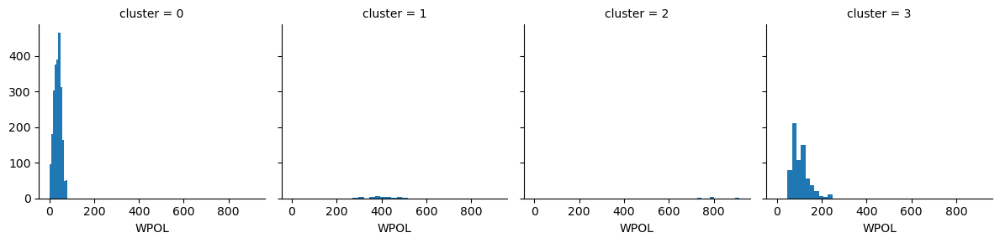

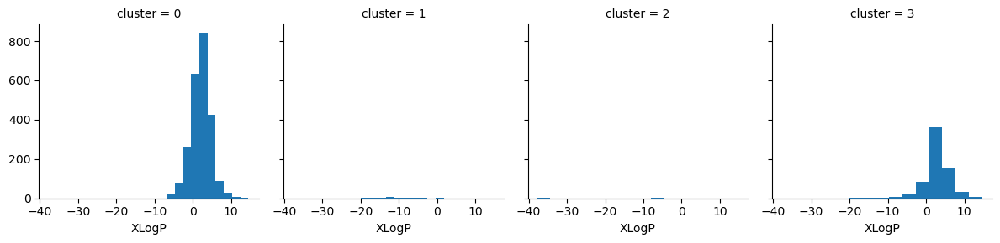

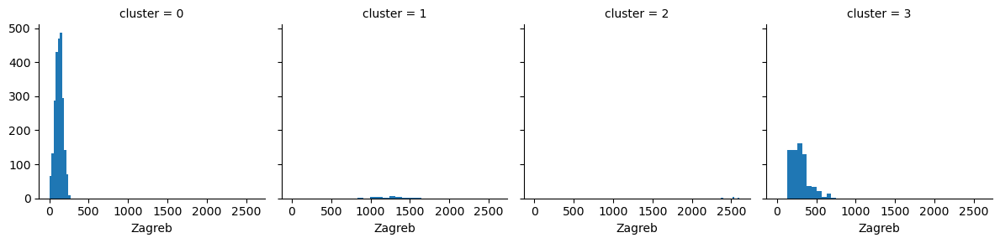

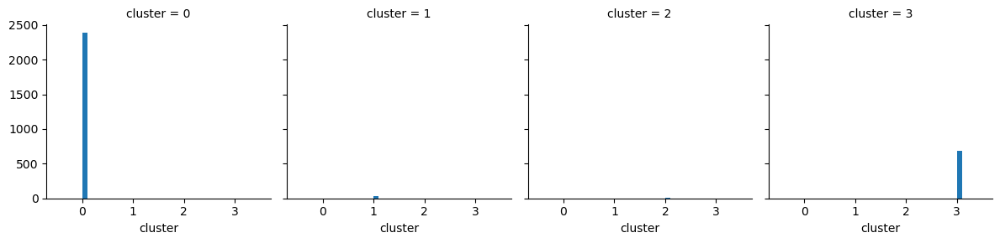

In [51]:
for c in clusters:
    grid = sns.FacetGrid(clusters, col="cluster")
    grid.map(plt.hist, c)

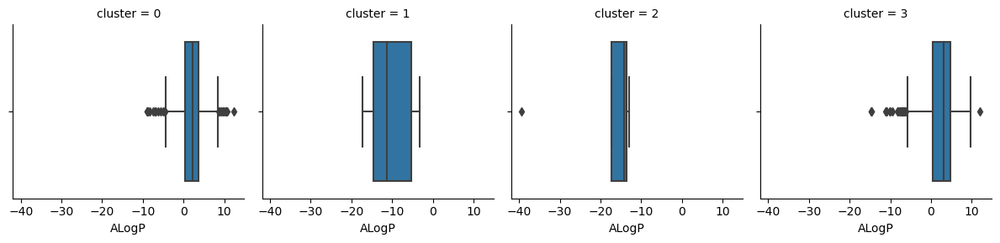

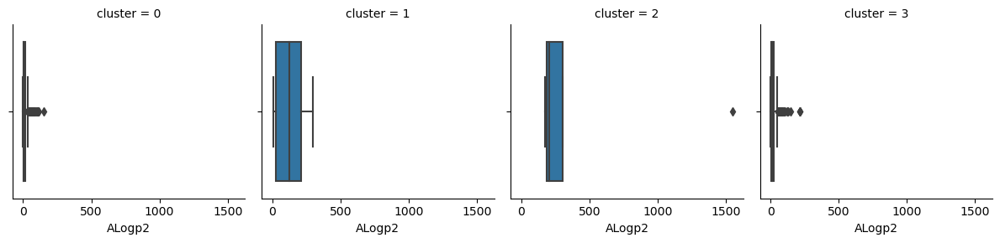

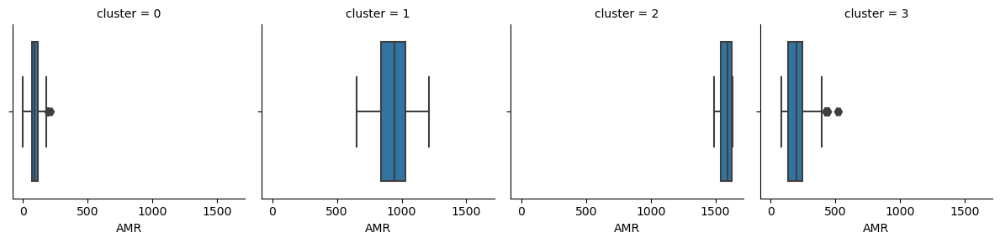

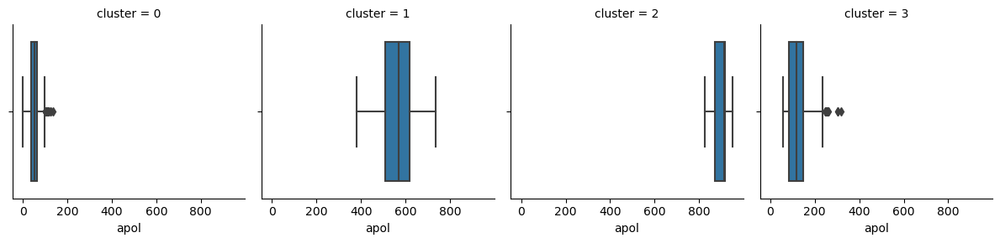

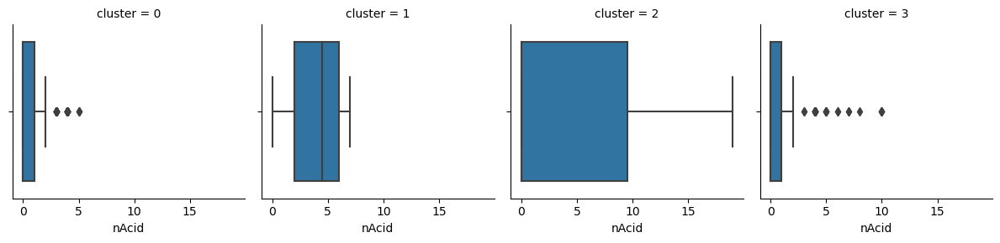

...

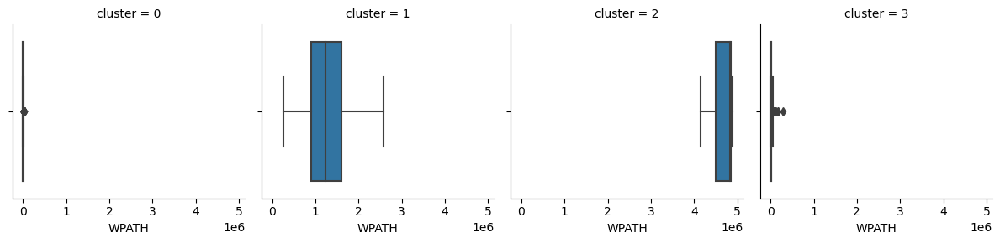

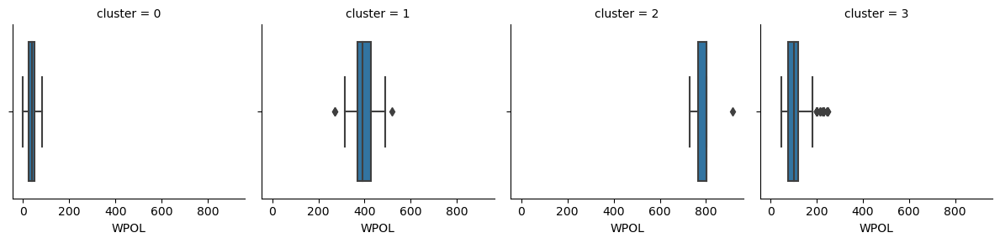

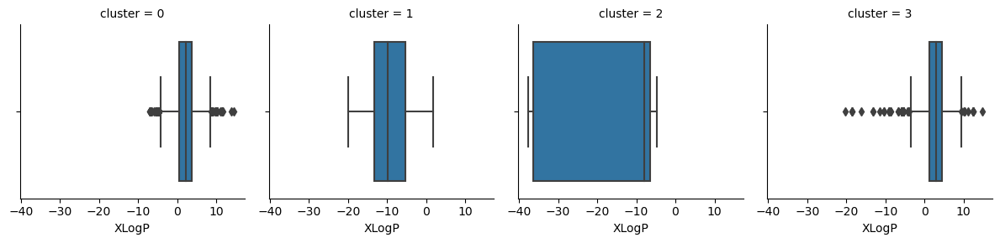

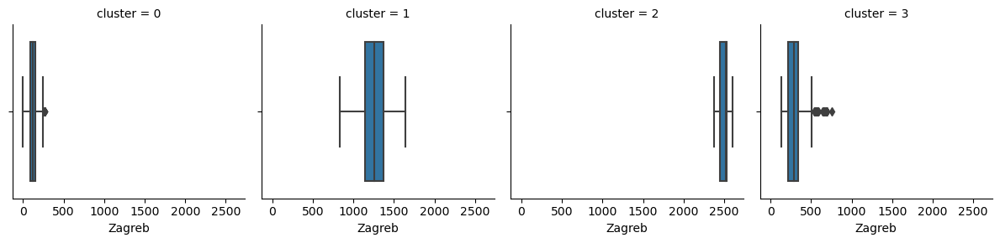

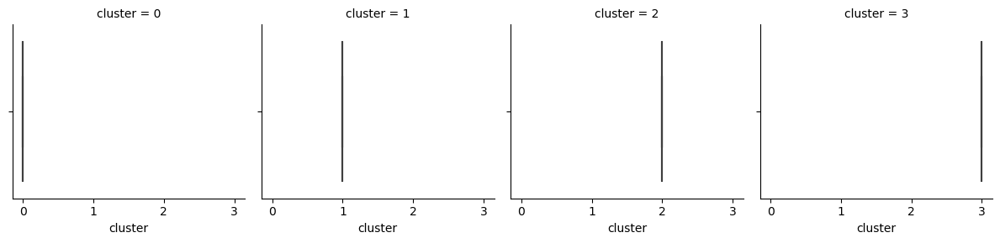

In [55]:
for c in clusters:
    grid = sns.FacetGrid(clusters, col="cluster")
    grid.map(sns.boxplot, c)

In [53]:
clusters['cluster'].value_counts()

0    2385
3     684
1      30
2       7
Name: cluster, dtype: int64

In [52]:
# grouping by cluster and getting descriptive values
cluster_analysis = clusters.groupby('cluster', as_index=False)['logkpl'].agg(['count', 'min', 'max', 'mean', 'std',
                                                                            lambda x: x.quantile(0.75) - x.quantile(0.25), 
                                                                            lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])
cluster_analysis.columns = ['count', 'min', 'max', 'mean', 'std', "IQR", "Q1", "Q3"]
cluster_analysis

KeyError: 'Column not found: logkpl'

In [40]:
cluster_analysis.to_excel("./clusters_analysis.xlsx")